In [1]:
from IPython.display import Image

## Czemu Jupyter (Julia+Python+R)?

* Jest narzędziem open sourcowym;
* Pozwala na egzekucje kodu kawałkami (dobre narzędzie do live demo);
* Pozwala na łatwą eksperymentację;
* Można w nim wyświetlać:
    - równania, np. $\sin^2(x) + \cos^2(x)=1$,
    - wizualizacje/zdjęcia;
    - tekst;
* Wspiera wiele języków programowania;
* Ciekawa alternatywa: google colab

## Krótko o pandas

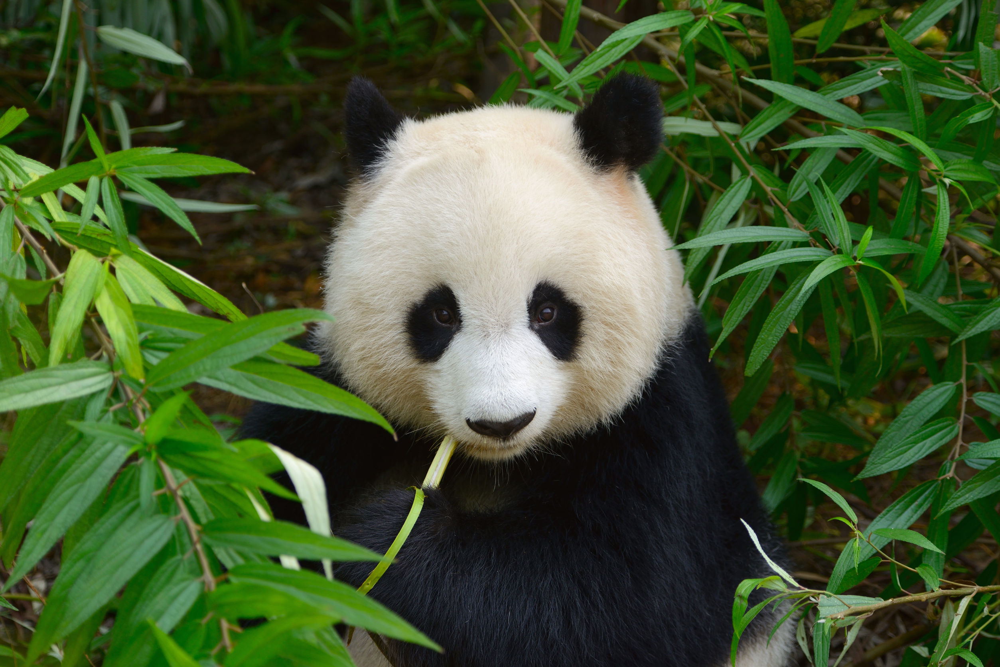

In [2]:
Image('../img/25311985_l.jpg', width=600)

* Pozwala na szybkie przetwarzanie ustrukturyzowanych danych (tabelaryczych);
* Wspiera wiele formatów plików;
* Pozwala na wizualizację

## Pandas in ML process

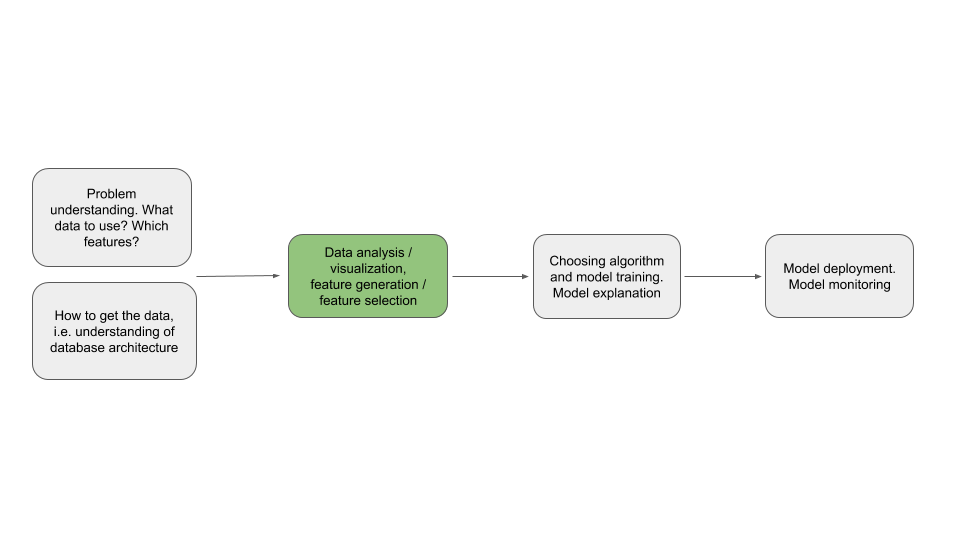

In [3]:
Image('../img/pandas-in-ml.png')

## Pandas DataFrame

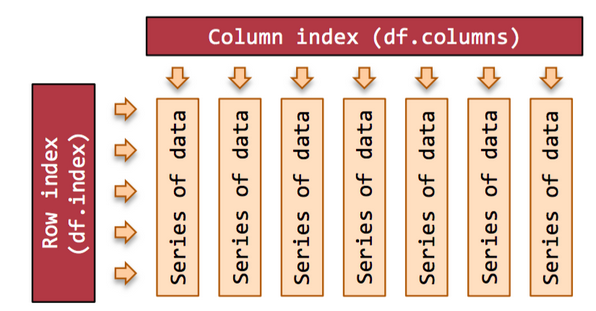

In [4]:
Image('../img/df.png')

## Tworzenie swojego DataFrame'u

In [5]:
import numpy as np
import pandas as pd

pd.options.plotting.backend = "plotly"  # do wyświetlania interaktywnych wykresów

In [6]:
kolumna_1 = [1, 2, 3, 4]
kolumna_2 = [4, 2, 4, 5]
kolumna_3 = [5, 6, 7, 10]

df_1 = pd.DataFrame({'kolumna_1': kolumna_1, 'kolumna_2': kolumna_2, 'kolumna_3': kolumna_3})
df_2 = pd.DataFrame(zip(kolumna_1, kolumna_2, kolumna_3), columns=['kolumna_1', 'kolumna_2', 'kolumna_3'])
df_3 = pd.DataFrame([kolumna_1, kolumna_2, kolumna_3])

### Kilka obserwacji

In [7]:
df_1['kolumna_1'].values  # w jaki sposób otrzymać wartości kolumny w postaci np.array

array([1, 2, 3, 4])

In [8]:
kolumna_1 + kolumna_2  # dodawanie zwykłych list

[1, 2, 3, 4, 4, 2, 4, 5]

In [9]:
np.array(kolumna_1) + np.array(kolumna_2)  # dodawanie list numpy

array([5, 4, 7, 9])

## Slicing DataFrame'u

In [10]:
test_df = df_1.copy()  # tworzenie kopii

### Kolumna (mamy wiele sposobów na "wyciągnięcie" kolumny z DataFrame'u)

In [11]:
test_df['kolumna_1']

0    1
1    2
2    3
3    4
Name: kolumna_1, dtype: int64

In [12]:
test_df.kolumna_1

0    1
1    2
2    3
3    4
Name: kolumna_1, dtype: int64

In [13]:
test_df.loc[:, 'kolumna_1']  # podanie nazwy/nazw kolumn

0    1
1    2
2    3
3    4
Name: kolumna_1, dtype: int64

In [14]:
test_df.loc[:, ['kolumna_1','kolumna_2']]  # wiele kolumn po nazwie

,kolumna_1,kolumna_2
0,1,4
1,2,2
2,3,4
3,4,5


In [15]:
test_df.loc[0:2, 'kolumna_2':'kolumna_3']

,kolumna_2,kolumna_3
0,4,5
1,2,6
2,4,7


In [16]:
test_df.iloc[:, 0]  # kolumny po indeksie

0    1
1    2
2    3
3    4
Name: kolumna_1, dtype: int64

### Rzędy

In [17]:
test_df.loc[1, :]

kolumna_1    2
kolumna_2    2
kolumna_3    6
Name: 1, dtype: int64

In [18]:
test_df.loc[2:3, :]

,kolumna_1,kolumna_2,kolumna_3
2,3,4,7
3,4,5,10


In [19]:
test_df.loc[::-1, :]  # możemy odwrócić kolejność klasyczną składnią Pythona

,kolumna_1,kolumna_2,kolumna_3
3,4,5,10
2,3,4,7
1,2,2,6
0,1,4,5


## Łączenie ze sobą dwóch DataFrameów

### Concat - łączenie listy dataframe'ów (jeden pod drugim)

In [20]:
pd.concat([df_1, df_2, df_2]).reset_index(drop=True)

,kolumna_1,kolumna_2,kolumna_3
0,1,4,5
1,2,2,6
2,3,4,7
3,4,5,10
4,1,4,5
5,2,2,6
6,3,4,7
7,4,5,10
8,1,4,5
9,2,2,6


### Append - łączenie dwóch dataframe'ów (jeden pod drugim)

In [21]:
df_1.append(df_2).reset_index(drop=True)

,kolumna_1,kolumna_2,kolumna_3
0,1,4,5
1,2,2,6
2,3,4,7
3,4,5,10
4,1,4,5
5,2,2,6
6,3,4,7
7,4,5,10


### Join dataframe'ów

In [22]:
df_1['id'] = ['1', '2', '3', '4']  # stworzenie indeksów, po których połączymy dataframy
df_2['id'] = ['1', '2', '3', '5']

In [23]:
df_2.columns = ['kolumna_5', 'kolumna_6', 'kolumna_7', 'id']

In [24]:
df_1

,kolumna_1,kolumna_2,kolumna_3,id
0,1,4,5,1
1,2,2,6,2
2,3,4,7,3
3,4,5,10,4


In [25]:
df_2

,kolumna_5,kolumna_6,kolumna_7,id
0,1,4,5,1
1,2,2,6,2
2,3,4,7,3
3,4,5,10,5


In [26]:
df_1.merge(df_2, on='id', how='outer')  # outer join

,kolumna_1,kolumna_2,kolumna_3,id,kolumna_5,kolumna_6,kolumna_7
0,1.0,4.0,5.0,1,1.0,4.0,5.0
1,2.0,2.0,6.0,2,2.0,2.0,6.0
2,3.0,4.0,7.0,3,3.0,4.0,7.0
3,4.0,5.0,10.0,4,NaN,NaN,NaN
4,NaN,NaN,NaN,5,4.0,5.0,10.0


In [27]:
df_1.merge(df_2, on='id', how='outer')  # inner join

,kolumna_1,kolumna_2,kolumna_3,id,kolumna_5,kolumna_6,kolumna_7
0,1.0,4.0,5.0,1,1.0,4.0,5.0
1,2.0,2.0,6.0,2,2.0,2.0,6.0
2,3.0,4.0,7.0,3,3.0,4.0,7.0
3,4.0,5.0,10.0,4,NaN,NaN,NaN
4,NaN,NaN,NaN,5,4.0,5.0,10.0


## Różne typy wykresów DataFrame

In [28]:
df_1.iloc[:, :-1].plot()

In [29]:
df_1.plot.scatter(x='kolumna_1', y='kolumna_2')  # hist, bar, scatter ...

## Tworzenie DataFrame'u z tablicy numpy - symulacja rozkładu normalnego

In [30]:
np_array = np.random.randn(1000, 100)
df_4 = pd.DataFrame(np_array)

In [31]:
df_4.plot.scatter(x=0, y=1)  # 0 i 1 to indeksy kolumn

In [32]:
cumsum_np_array = np.cumsum(np_array, axis=1)

In [33]:
df_1 = pd.DataFrame(cumsum_np_array)

In [34]:
df_1

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-1.196298,-1.024093,0.014738,-1.144373,-0.248787,-1.521154,-2.385887,-1.817614,-2.400432,-2.329622,...,-10.925405,-12.024592,-11.748368,-11.991825,-14.322877,-14.515820,-13.562577,-13.827585,-14.592532,-14.568330
1,1.245821,1.692029,2.438418,1.417558,0.284714,0.627386,2.100059,0.592634,0.663696,2.073635,...,4.485140,4.812938,5.553561,4.603243,3.893858,5.741277,5.925003,3.952721,3.888073,2.719489
2,1.146989,0.046004,-2.121930,-2.637114,-0.642695,-0.092326,0.607746,1.837874,0.713864,1.959767,...,12.742333,12.309789,12.137980,13.471469,14.914935,14.405110,13.943023,13.662161,14.168965,15.128511
3,0.079707,0.556471,-0.515385,-0.590194,-0.739529,-0.628186,0.474420,1.147355,0.630005,2.295486,...,-8.294687,-6.800174,-5.836206,-5.829779,-6.713364,-5.636506,-4.405004,-5.715798,-5.536749,-5.780829
4,0.587045,0.567661,-0.372294,-0.682095,-0.975694,-1.466356,-3.167099,-1.927285,-1.266985,-1.690284,...,-0.630689,-1.745955,-1.940521,-1.883726,-1.514592,0.120111,1.130450,1.463620,1.929789,2.153492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.780221,0.201309,0.906164,0.699904,-3.262308,-3.153631,-3.291917,-3.893898,-2.435527,-0.347618,...,-11.938811,-11.516654,-11.961392,-12.281395,-12.627808,-12.013073,-13.551966,-13.176146,-11.810158,-9.620493
996,0.866943,0.375085,0.522400,0.872901,-0.089309,1.329987,2.184524,0.842402,1.090005,1.929806,...,3.946697,1.958820,-0.211307,0.239525,0.450576,2.290655,1.082805,1.254130,0.365449,1.457523
997,-0.396066,-0.084995,0.317106,-0.610918,0.697414,0.079321,-0.871054,-1.339347,-1.107323,-2.504554,...,-8.998645,-8.113566,-8.138779,-7.115453,-7.555728,-8.187680,-7.814306,-9.551424,-9.165394,-9.749136
998,-0.904918,-0.259816,0.240145,-1.023278,-0.808281,-1.549316,-0.919855,-1.273703,-1.780153,-1.804633,...,4.572778,5.234809,3.729632,4.424873,4.673619,4.749361,4.415534,6.238233,4.446139,5.944058


In [35]:
df_1.plot()